In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
import seaborn as sns

colors = [(0,0,0)]
colors =[(0,0,0)] +  sns.color_palette("muted", 6)+[(.2,.2,.2)]


outlier_functions = ['control', 'kNN', 'LOF', 'iforest', 'pca', 'kde', 'mahalanobis','random']
color_dict = dict(zip(outlier_functions, colors))

In [4]:
# Load the CSV data
data = pd.read_csv("results/classifier_w_target/results_prime_wBM.csv")

In [5]:
data

,Dataset,Split_Val,Outlier_Function,Class_Function,Threshold_Val,ParA_Val,ParB_Val,Outliers Removed Pct,Accuracy,f1_score_macro,f1_score_macro.1,Precision_micro,Precision_macro,Recall_micro,Recall_macro,Elapsed Time
0,covtype_partial_mmNorm,400,kNN,decision_tree_classifier,0.05,4,Med,0.0050,0.598684,0.588688,0.588688,0.598684,0.598077,0.598684,0.584586,0.301341
1,covtype_partial_mmNorm,400,kNN,gradient_boosting_classifier,0.05,4,Med,0.0050,0.680658,0.668204,0.668204,0.680658,0.673590,0.680658,0.667712,0.301341
2,covtype_partial_mmNorm,400,kNN,knn_classifier,0.05,4,Med,0.0050,0.611974,0.603064,0.603064,0.611974,0.611574,0.611974,0.603021,0.301341
3,covtype_partial_mmNorm,400,kNN,logistic_regression_classifier,0.05,4,Med,0.0050,0.603947,0.575460,0.575460,0.603947,0.615552,0.603947,0.581886,0.301341
4,covtype_partial_mmNorm,400,kNN,random_forest_classifier,0.05,4,Med,0.0050,0.692105,0.655573,0.655573,0.692105,0.680623,0.692105,0.669266,0.301341
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17845,covtype_partial_mmNorm_noise_0.1,1200,random,gradient_boosting_classifier,0.35,4,Med,0.0275,0.670441,0.655695,0.655695,0.670441,0.662745,0.670441,0.651485,0.000296
17846,covtype_partial_mmNorm_noise_0.1,1200,random,knn_classifier,0.35,4,Med,0.0275,0.477794,0.454926,0.454926,0.477794,0.489072,0.477794,0.449404,0.000296
17847,covtype_partial_mmNorm_noise_0.1,1200,random,logistic_regression_classifier,0.35,4,Med,0.0275,0.502794,0.477909,0.477909,0.502794,0.497081,0.502794,0.476987,0.000296
17848,covtype_partial_mmNorm_noise_0.1,1200,random,random_forest_classifier,0.35,4,Med,0.0275,0.666912,0.644985,0.644985,0.666912,0.671893,0.666912,0.636487,0.000296


In [6]:
datasets = data['Dataset'].unique()
split_vals = data['Split_Val'].unique()
class_functions = data['Class_Function'].unique()
outlier_functions = data['Outlier_Function'].unique()
class_functions_names = [str(func).replace('_classifier', '') for func in class_functions]



In [103]:
outlier_functions= ['control', 'kNN', 'LOF', 'iforest', 'pca', 'kde','mahalanobis','random']


metric = 'Accuracy'

In [104]:
class_functions


array(['decision_tree_classifier', 'gradient_boosting_classifier',
       'knn_classifier', 'logistic_regression_classifier',
       'random_forest_classifier', 'support_vector_classifier'],
      dtype=object)

In [105]:
datasets = ['covtype_partial_mmNorm', 'covtype_partial_mmNorm_noise_0.1',
        'eeg-eye-state_normMM', 'eeg-eye-state_normMM_noise_0.1',
        'yeast_mmNorm', 'yeast_mmNorm_noise_0.1',
        'run_or_walk_normMM',  'run_or_walk_normMM_noise_0.1',
        'Dry_Bean_mmNorm','Dry_Bean_mmNorm_noise_0.1',
        'shuttle_mmNorm', 'shuttle_mmNorm_noise_0.1']

/Users/vikramadipudi/Desktop/Thesis_research/Workspace/OR_env/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/vikramadipudi/Desktop/Thesis_research/Workspace/OR_env/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/vikramadipudi/Desktop/Thesis_research/Workspace/OR_env/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/vikramadipudi/Desktop/Thesis_research/Workspace/OR_env/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/vikramadipudi/Desktop/Thesis_research/Workspace/OR_env/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of e

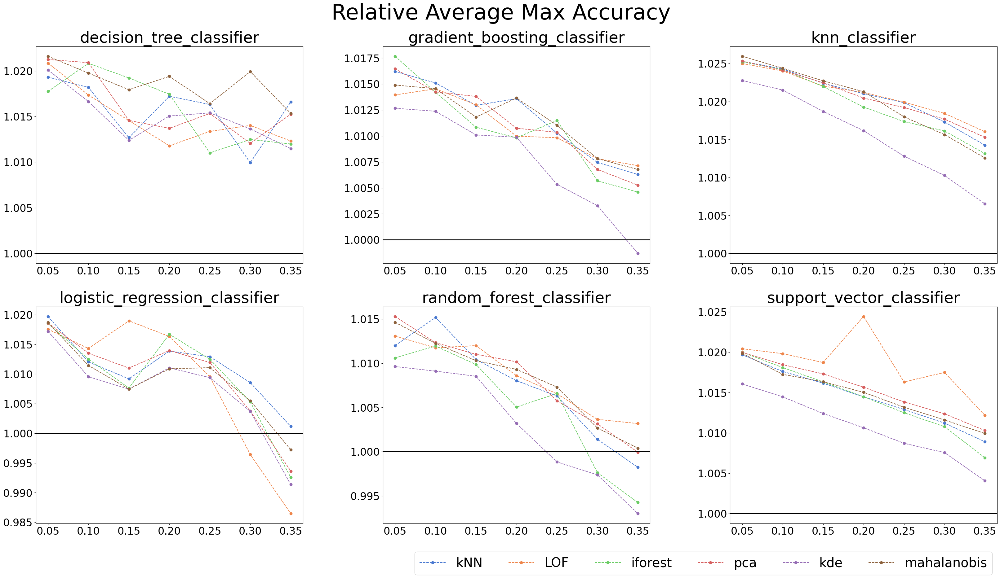

In [125]:

filtered_df =data
fig, axs = plt.subplots(2,3, figsize=(40,20))
plt.subplots_adjust(wspace=0.3)

for i,  class_function in enumerate(class_functions):
    filtered_df2 = filtered_df[filtered_df['Class_Function'] == class_function]
    
    ylim_min = max(-.5, filtered_df2[metric].min()) # Dynamic calculation of y-axis limits
    ylim_max =  min(1,filtered_df2[metric].max()) # Dynamic calculation of y-axis limits
    
    control_df = filtered_df2[filtered_df2['Outlier_Function'] == 'control']

    for j,  OR_func in enumerate(outlier_functions):
        # if OR_func == 'control':
        #     continue
        filtered_df3 = filtered_df2[filtered_df2 ['Outlier_Function'] == OR_func]
        
        
        values_arr = []
        
        for k, dataset in enumerate(datasets): 
            # print(f'Plotting for {OR_func}')
            filtered_df4 = filtered_df3[filtered_df3['Dataset'] == dataset]
            control_df = control_df[control_df['Outlier_Function'] == 'control']

            control_val = control_df[metric].mean()
            if OR_func == 'control':
            #     accuracy_values = or_func_df[metric]
            #     avg_accuracy = accuracy_values.mean()
            #     axs[i][j].axhline(y=avg_accuracy, color='black', label='Control Accuracy')
                continue

            
            contam_pct = filtered_df4['Threshold_Val'].apply(lambda x: round(x, 2))
            # if len(contam_pct) !=35:
            #     continue
            accuracy_values = filtered_df4[metric]/control_val
            max_accuracy = accuracy_values.groupby(contam_pct).max() 
            if len(max_accuracy) <7:
                continue
            values_arr.append(max_accuracy.to_list())

        mean_values = np.mean(values_arr, axis=0)  # Calculate the mean values across all datasets
        
        if OR_func == 'random':
            # axs[i].plot(contam_pct.unique(), mean_values, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)\
            continue
        if OR_func == 'control':
            continue

        else:
            axs[int(i/3)][i%3].plot(contam_pct.unique(), mean_values, marker='o',linestyle='--',color =color_dict[OR_func],label=OR_func)  # Add label for each OR_func
            
        axs[int(i/3)][i%3].set_title(f"{class_function}",fontsize = 36)
        # axs[i].set_ylim(ylim_min, ylim_max)

        axs[int(i/3)][i%3].axhline(y=1, color='black')
        axs[int(i/3)][i%3].tick_params( axis='both', which='major', labelsize=24)


    

fig.suptitle(f'Relative Average Max {metric}', fontsize=50, y=.95)

plt.legend(loc='upper center', bbox_to_anchor=(-0.1, -0.1), ncol=6, fontsize=30)

# Show the plot
plt.show()

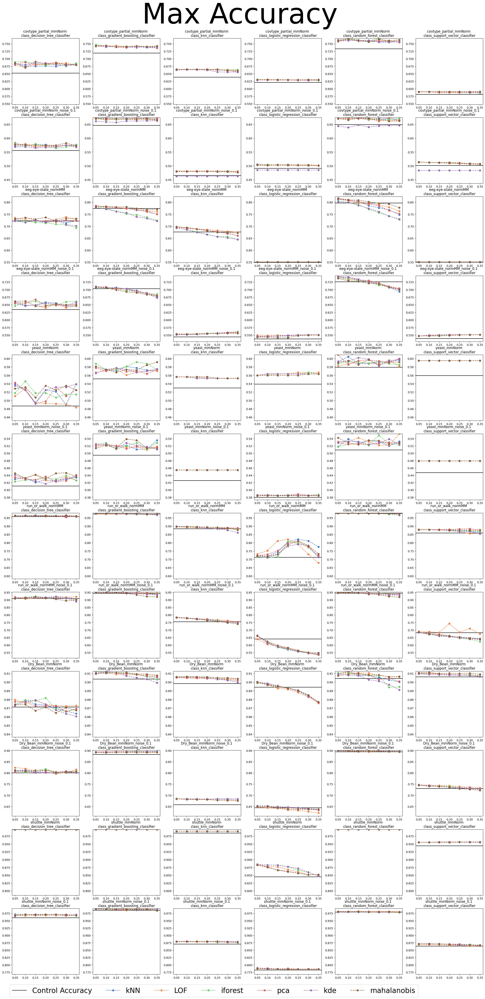

In [114]:
import pandas as pd

filtered_df =data
fig, axs = plt.subplots( len(datasets),len(class_functions), figsize=(30,60))

for i, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    
    ylim_min = max(-.5, filtered_df2[metric].min()) # Dynamic calculation of y-axis limits
    ylim_max =  min(1,filtered_df2[metric].max()) # Dynamic calculation of y-axis limits
    
    for j, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                accuracy_values = or_func_df[metric]
                avg_accuracy = accuracy_values.mean()
                axs[i][j].axhline(y=avg_accuracy, color='black', label='Control Accuracy')
                continue
            elif OR_func == 'random':
                # contam_pct = or_func_df['Outliers Removed Pct']
                # rMSE_values = or_func_df[metric]
                # axs[i][j].plot(contam_pct, rMSE_values, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)
                continue
            
            contam_pct = or_func_df['Threshold_Val'].apply(lambda x: round(x, 2))
            
            accuracy_values = or_func_df[metric]
            max_accuracy = accuracy_values.groupby(contam_pct).max()  # Get the maximum value at each threshold
            
            
# Create a DataFrame with contam_pct.unique() and max_accuracy values
            points = {'contam_pct': contam_pct.unique(), 'max_accuracy': max_accuracy}
            df = pd.DataFrame(points)

            # Sort the DataFrame by contam_pct
            df_sorted = df.sort_values('contam_pct')

            

            axs[i][j].plot(df_sorted['contam_pct'], df_sorted['max_accuracy'], marker='o',linestyle='--',color =color_dict[OR_func],label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{dataset} \nclass_{class_function}")
        axs[i][j].set_ylim(ylim_min, ylim_max)
        # axs[i][j].set_xlim(0.03, 0.37)
    

fig.suptitle(f'Max {metric}', fontsize=100,y=.91)

axs[11, 2].legend(loc='upper center', bbox_to_anchor=(0.6, -0.1), ncol=7, fontsize=25)

# Show the plot
plt.show()

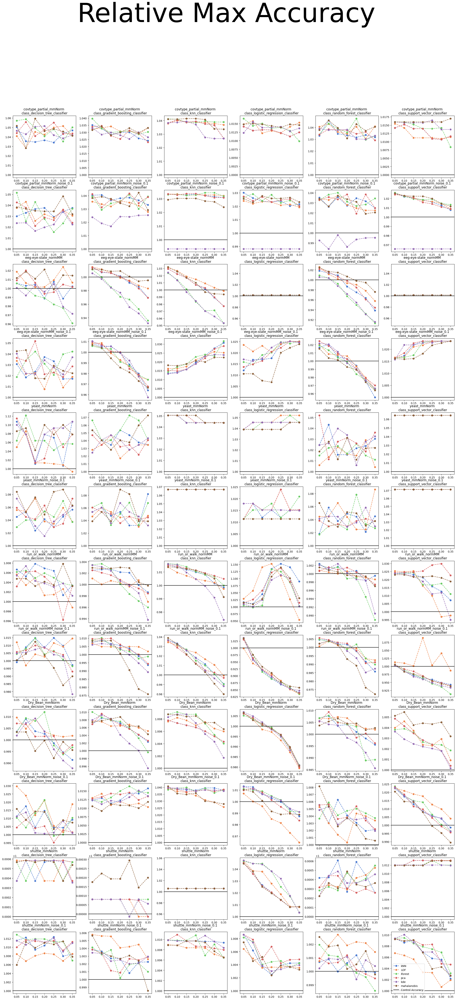

In [121]:
import pandas as pd

filtered_df =data
fig, axs = plt.subplots( len(datasets),len(class_functions), figsize=(30,60))

for i, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    
    # ylim_min = max(-.24, filtered_df2[metric].min()) # Dynamic calculation of y-axis limits
    # ylim_max = min(2, filtered_df2[metric].max()) # Dynamic calculation of y-axis limits

    for j, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        control_df = filtered_df3[filtered_df3['Outlier_Function'] == 'control']
        control_acc = control_df[metric].mean()
        # ylim_min = max(-.5, filtered_df2[metric].min()) # Dynamic calculation of y-axis limits
        # ylim_max =  max(1.5, filtered_df2[metric].max()) # Dynamic calculation of y-axis limits
        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            control_val = control_df[control_df['Dataset'] ==dataset][metric].mean()
            if OR_func == 'control':
            #     accuracy_values = or_func_df[metric]
            #     avg_accuracy = accuracy_values.mean()
            #     axs[i][j].axhline(y=avg_accuracy, color='black', label='Control Accuracy')
                continue
            if OR_func == 'random':
                # contam_pct = or_func_df['Outliers Removed Pct']
                # rMSE_values = or_func_df[metric]
                # axs[i][j].plot(contam_pct, rMSE_values, marker='x',  linestyle=':',color =color_dict[OR_func] , label=OR_func)
                continue
            
            contam_pct = or_func_df['Threshold_Val'].apply(lambda x: round(x, 2))
            
            accuracy_values = or_func_df[metric]/control_acc
            max_accuracy = accuracy_values.groupby(contam_pct).max()  # Get the maximum value at each threshold
            
            
# Create a DataFrame with contam_pct.unique() and max_accuracy values
            points = {'contam_pct': contam_pct.unique(), 'max_accuracy': max_accuracy}
            df = pd.DataFrame(points)

            # Sort the DataFrame by contam_pct
            df_sorted = df.sort_values('contam_pct')

            

            axs[i][j].plot(df_sorted['contam_pct'], df_sorted['max_accuracy'], marker='o',linestyle='--',color =color_dict[OR_func],label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{dataset} \nclass_{class_function}")
        axs[i][j].axhline(y=1, color='black', label='Control Accuracy')

        axs[i][j].set_xlim(0.03, 0.37)
    

fig.suptitle(f'Relative Max {metric}', fontsize=100)

plt.legend()

# Show the plot
plt.show()

In [109]:
split_val=800

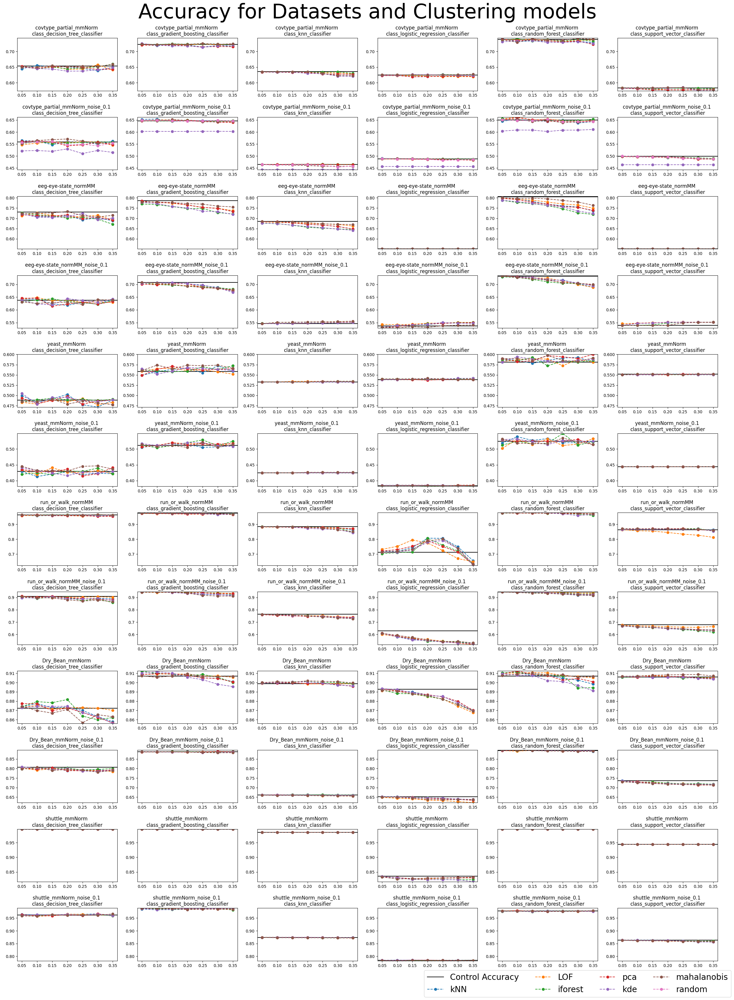

In [110]:
# Create a figure and subplots
filtered_df = data[data['Split_Val'] == 800]
fig, axs = plt.subplots(len(datasets), len(class_functions), figsize=(30, 40))
plt.subplots_adjust(hspace=0.5, top=.99, bottom=0.2, left=0.1, right=0.9)

for i, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    ylim_min = min(filtered_df2[metric][pd.to_numeric(filtered_df2[metric]).notnull()])  # Dynamic calculation of y-axis limits
    ylim_max = filtered_df2[metric].max()  # Dynamic calculation of y-axis limits
    for j, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]

        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                accuracy_values = or_func_df[metric]
                avg_accuracy = accuracy_values.mean()
                axs[i][j].axhline(y=avg_accuracy, color='k',  label='Control Accuracy')
                continue
            
            contam_pct = or_func_df['Threshold_Val']
            accuracy_values = or_func_df[metric]
            axs[i][j].plot(contam_pct, accuracy_values, marker='o',  linestyle='--',label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{dataset} \nclass_{class_function}")
        axs[i][j].set_ylim(ylim_min, ylim_max)
    

fig.suptitle(f'{metric} for Datasets and Clustering models', fontsize=50, y=1.02)

plt.legend(loc='upper center', bbox_to_anchor=(-0.4, -0.1), ncol=4, fontsize=20)

# Show the plot
plt.show()


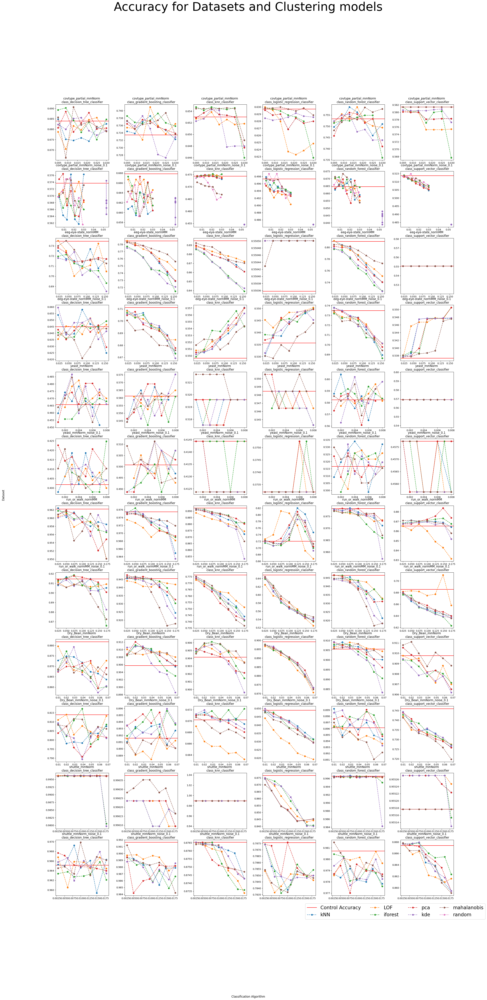

In [111]:
# Create a figure and subplots
split_val = 1000
filtered_df = data[data['Split_Val'] == split_val]
fig, axs = plt.subplots( len(datasets),len(class_functions), figsize=(30,60))
plt.subplots_adjust(wspace=0.3)


for i, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    
    for j, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                accuracy_values = or_func_df[metric]
                avg_accuracy = accuracy_values.mean()
                axs[i][j].axhline(y=avg_accuracy, color='r', label='Control Accuracy')
                continue
            
            contam_pct = or_func_df['Outliers Removed Pct']
            accuracy_values = or_func_df[metric]
            axs[i][j].plot(contam_pct, accuracy_values, marker='o',  linestyle='--',label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{dataset} \nclass_{class_function}")
        # axs[i][j].set_xlim(0.03, 0.37)
    
fig.supylabel('Dataset')
fig.suptitle(f'{metric} for Datasets and Clustering models', fontsize=50)

fig.supxlabel('Classification Algorithm')  
plt.legend(loc='upper center', bbox_to_anchor=(-0.1, -0.1), ncol=4, fontsize=20)


# Show the plot
plt.show()

In [112]:


for i, OR_func in enumerate(unique_values):
    print(f'Plotting for {OR_func}')
    or_func_df = filtered_df[filtered_df['Outlier_Function'] == OR_func]
    if OR_func == 'control':
        accuracy_values = or_func_df[metric]
        avg_accuracy = accuracy_values.mean()
        plt.axhline(y=avg_accuracy, color='r', linestyle='--', label='Control Accuracy')
        continue
    
    contam_pct = or_func_df['Outliers Removed Pct']
    accuracy_values = or_func_df[metric]
    plt.plot(contam_pct, accuracy_values, label=OR_func)  # Add label for each OR_func

plt.xlabel('outliers removed pct')
plt.ylabel(metric)
plt.title(f'Accuracy over Threshold for Dataset: {dataset}, Split: , Class: {class_function}')
plt.legend()  # Add legend
plt.show()

NameError: name 'unique_values' is not defined

split_vals x class function

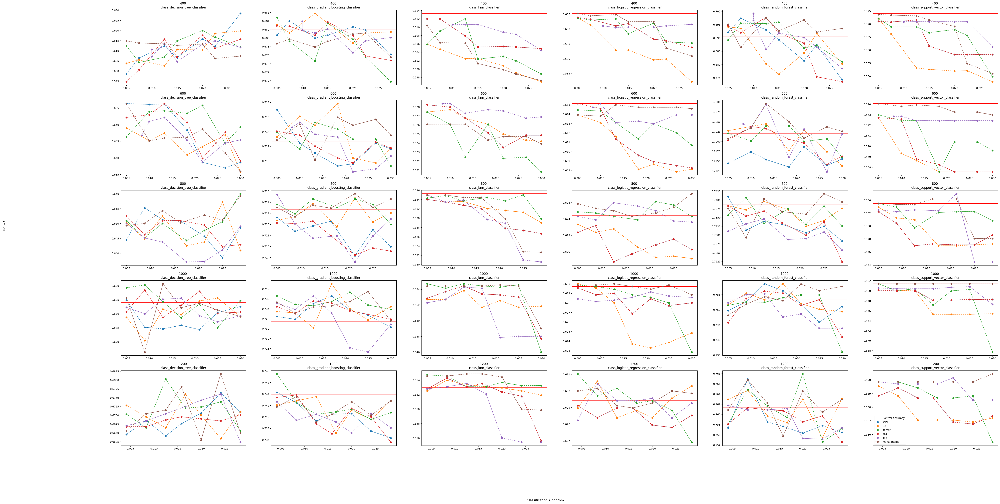

In [ ]:
dataset='covtype_partial_mmNorm'
# Create a figure and subplots
filtered_df = data[data['Dataset'] == dataset]
filtered_df = filtered_df[(filtered_df['ParA_Val'] == 4) | (filtered_df['Outlier_Function'] == 'kde') | (filtered_df['Outlier_Function'] == 'control')]
fig, axs = plt.subplots( len(split_vals), len(class_functions),figsize=(60, 30))


for i, split_val in enumerate(split_vals):
    filtered_df2 = filtered_df[filtered_df['Split_Val'] == split_val ]
    
    for j, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        for k, OR_func in enumerate(outlier_functions):
            # print(f'Plotting for {OR_func}')
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            if OR_func == 'control':
                accuracy_values = or_func_df[metric]
                avg_accuracy = accuracy_values.mean()
                axs[i][j].axhline(y=avg_accuracy, color='r', label='Control Accuracy')
                continue
            
            contam_pct = or_func_df['Outliers Removed Pct']
            accuracy_values = or_func_df[metric]
            axs[i][j].plot(contam_pct, accuracy_values, marker='o',  linestyle='--',label=OR_func)  # Add label for each OR_func
            
        axs[i][j].set_title(f"{split_val} \nclass_{class_function}")
    
fig.supylabel('splitval')

fig.supxlabel('Classification Algorithm')  
plt.legend()

# Show the plot
plt.show()

oulieer x Class_Function

In [ ]:
# split_val=1000
# # Create a figure and subplots
# filtered_df = data[data['Split_Val'] == split_val]
# filtered_df = filtered_df[(filtered_df['ParA_Val'] == 4) | (filtered_df['Outlier_Function'] == 'kde') | (filtered_df['Outlier_Function'] == 'control')]
# fig, axs = plt.subplots( len(outlier_functions)-1, len(class_functions),figsize=(60, 30))


# control_df = filtered_df[filtered_df['Outlier_Function'] == 'control']
# for i, outlier_function in enumerate(outlier_functions):
#     filtered_df2 = filtered_df[filtered_df['Outlier_Function'] == outlier_function ]
#     if outlier_function == 'control':
#         continue
#     for j, class_function in enumerate(class_functions):
#         filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
#         control_df2 = control_df[control_df['Class_Function'] == class_function]
#         for k, dataset in enumerate(datasets):
#             # print(f'Plotting for {OR_func}')
#             or_func_df = filtered_df3[filtered_df3['Dataset'] == dataset]
#             control_df3 = control_df2[control_df2['Dataset'] == dataset]

            
#             control = np.mean(control_df3[metric])
            
#             contam_pct = or_func_df['Outliers Removed Pct']
#             acccuracy_values = or_func_df[metric]/control
#             axs[i][j].plot(contam_pct, acccuracy_values, label=dataset)  # Add label for each OR_func
            
#         axs[i][j].set_title(f"{outlier_function} \nreg_{class_function}")
#         axs[i][j].set_yscale('log')  # Set y-axis to logarithmic scale

# fig.supylabel('splitval')

# fig.supxlabel('Classification Algorithm')  
# plt.legend()

# # Show the plot
# plt.show()

bar chart

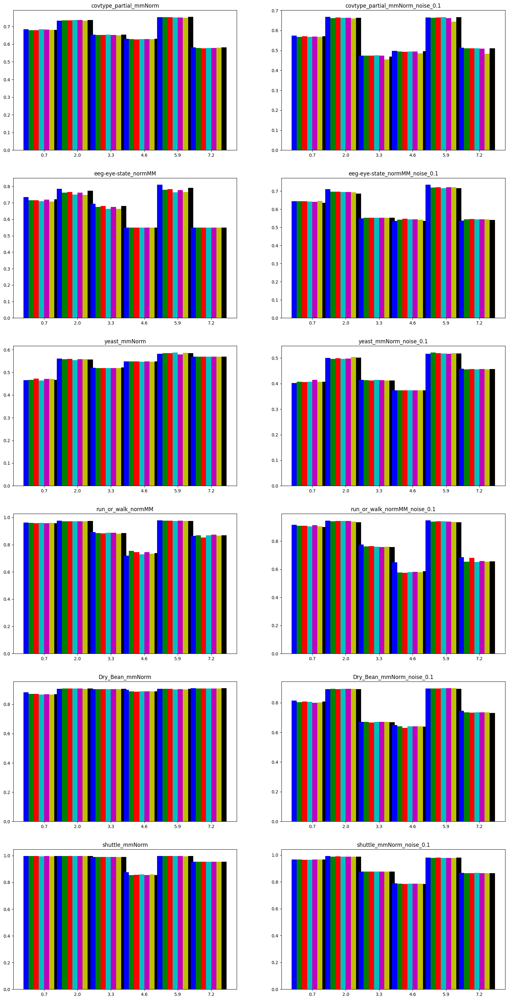

In [ ]:
split_val=1000
# Grouped bar chart
# Create a figure and subplots
filtered_df = data[data['Split_Val'] == split_val]
filtered_df = filtered_df[(filtered_df['ParA_Val'] == 4) | (filtered_df['Outlier_Function'] == 'kde') | (filtered_df['Outlier_Function'] == 'control')]


filtered_df = filtered_df[filtered_df['Class_Function'] != "polynomial_regression"]
class_functions = filtered_df['Class_Function'].unique()

colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

fig, axs = plt.subplots( int(len(datasets)/2),2, figsize=(20,40))

# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(class_functions)) *1.3

for a, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    i=int(a/2)
    if dataset.endswith('0.1'):
        j=1
    else:
        j=0 
        
        
    # Loop through each class_function
    for b, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        
        # Loop through each outlier function
        for c, OR_func in enumerate(outlier_functions):
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            rMSE_mean = or_func_df[metric].mean()
            
            # Plot the bar for each outlier function
            axs[i][j].bar(x[b] + (c * bar_width), rMSE_mean, width=bar_width, label=OR_func,color=colors[c])
            
    axs[i][j].set_title(f"{dataset}")
    axs[i][j].set_xticks(x + (len(outlier_functions) * bar_width) / 2)

plt.show()

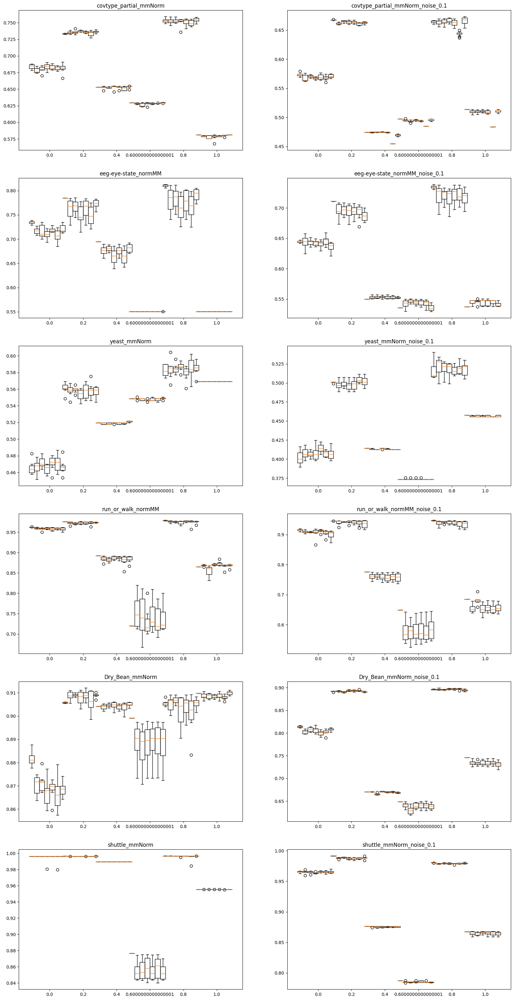

In [ ]:
fig, axs = plt.subplots( int(len(datasets)/2),2, figsize=(20,40))

# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(class_functions)) *1.3

for a, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    i=int(a/2)
    if dataset.endswith('0.1'):
        j=1
    else:
        j=0 
        
        
    # Loop through each class_function
    for b, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        
        # Loop through each outlier function
        for c, OR_func in enumerate(outlier_functions):
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            rMSE_mean = or_func_df[metric].mean()
            
            # Plot the bar for each outlier function
            axs[i][j].boxplot(or_func_df[metric], positions=[x[b] + (c * bar_width)], widths=bar_width)
            
    axs[i][j].set_title(f"{dataset}")
    axs[i][j].set_xticks(x + (len(outlier_functions) * bar_width) / 2)

plt.show()

bar chart pct of control

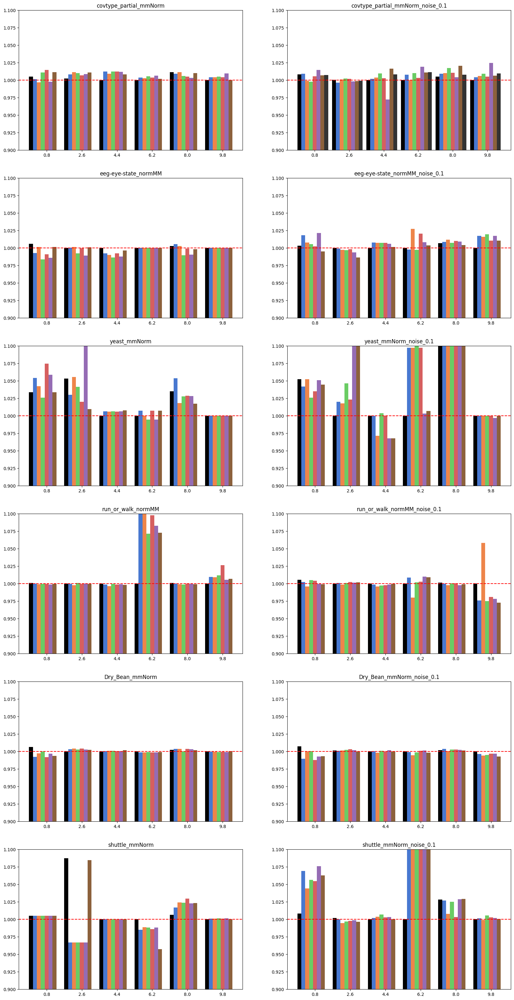

In [ ]:
split_val=1000
# Grouped bar chart
# Create a figure and subplots
filtered_df = data[data['Split_Val'] == split_val]
filtered_df = filtered_df[(filtered_df['ParA_Val'] == 4) | (filtered_df['Outlier_Function'] == 'kde') | (filtered_df['Outlier_Function'] == 'random') | (filtered_df['Outlier_Function'] == 'control')]


filtered_df = filtered_df[filtered_df['Class_Function'] != "polynomial_regression"]
class_functions = filtered_df['Class_Function'].unique()



fig, axs = plt.subplots( int(len(datasets)/2),2, figsize=(20, 40))

# Set the width of each bar
bar_width = 0.2

# Set the x positions of the bars
x = np.arange(len(class_functions)) *1.8

for a, dataset in enumerate(datasets):
    filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
    i=int(a/2)
    if dataset.endswith('0.1'):
        j=1
    else:
        j=0 
        
        
    # Loop through each class_function
    for b, class_function in enumerate(class_functions):
        filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
        control = filtered_df3[filtered_df3['Outlier_Function'] == 'control'][metric].mean()
        # Loop through each outlier function
        for c, OR_func in enumerate(outlier_functions):
            or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
            rMSE_mean = or_func_df[metric].max()
            
            rMSE_mean_pct = rMSE_mean/control
            # Plot the bar for each outlier function
            axs[i][j].bar(x[b] + (c * bar_width), rMSE_mean_pct, width=bar_width, label=OR_func,color = color_dict[OR_func])
    
    axs[i][j].set_title(f"{dataset}")
    axs[i][j].set_xticks(x + (len(outlier_functions) * bar_width) / 2)
    axs[i][j].set_ylim(0.9, 1.1)
    # axs[i][j].set_xticklabels(class_functions_names, rotation=45, ha='right')
    
    # Draw a horizontal line at 1.0 dashed
    axs[i][j].axhline(y=1.0, color='r', linestyle='--')
    
# Set the x-axis labels
# ax.set_xticks(x + (len(outlier_functions) * bar_width) / 2)
# ax.set_xticklabels(class_functions_names, rotation=45, ha='right')

# Set the y-axis label
# ax.set_ylabel('Mean Accuracy')

# # Set the chart title
# ax.set_title('Grouped Bar Chart for Mean Accuracy')

# Add a legend
# ax.legend()

# Show the plot
plt.show()

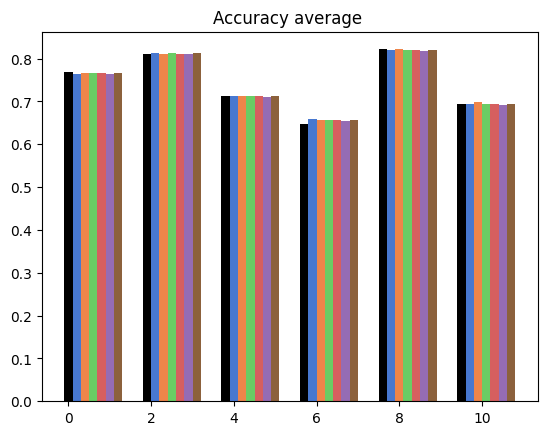

In [ ]:
split_val=1000
# Grouped bar chart
# Create a figure and subplots
filtered_df = data
# filtered_df = filtered_df[(filtered_df['ParA_Val'] == 4) | (filtered_df['Outlier_Function'] == 'kde') | (filtered_df['Outlier_Function'] == 'random') | (filtered_df['Outlier_Function'] == 'control')]


# filtered_df = filtered_df[filtered_df['Class_Function'] != "polynomial_regression"]
class_functions = filtered_df['Class_Function'].unique()


# Set the width of each bar
bar_width = 0.2

# # Set the x positions of the bars
# x = np.arange(len(class_functions)) *1.8

# for a, dataset in enumerate(datasets):
#     filtered_df2 = filtered_df[filtered_df['Dataset'] == dataset]
#     i=int(a/2)
#     if dataset.endswith('0.1'):
#         j=1
#     else:
#         j=0 
        
        
#     # Loop through each class_function
#     for b, class_function in enumerate(class_functions):
#         filtered_df3 = filtered_df2[filtered_df2['Class_Function'] == class_function]
#         control = filtered_df3[filtered_df3['Outlier_Function'] == 'control'][metric].mean()
#         # Loop through each outlier function
#         for c, OR_func in enumerate(outlier_functions):
#             or_func_df = filtered_df3[filtered_df3['Outlier_Function'] == OR_func]
#             rMSE_mean = or_func_df[metric].min()
            
#             rMSE_mean_pct = rMSE_mean/control
#             # Plot the bar for each outlier function
#             axs[i][j].bar(x[b] + (c * bar_width), rMSE_mean_pct, width=bar_width, label=OR_func,color = color_dict[OR_func])
    
#     axs[i][j].set_title(f"{dataset}")
#     axs[i][j].set_xticks(x + (len(outlier_functions) * bar_width) / 2)
#     axs[i][j].set_ylim(0.9, 1.1)
#     # axs[i][j].set_xticklabels(class_functions_names, rotation=45, ha='right')
    
#     # Draw a horizontal line at 1.0 dashed
#     axs[i][j].axhline(y=1.0, color='r', linestyle='--')
    
# # Set the x-axis labels
# # ax.set_xticks(x + (len(outlier_functions) * bar_width) / 2)

# plt.show()

x = np.arange(len(class_functions)) *1.9


for b, class_function in enumerate(class_functions):
    filtered_df2 = data[data['Class_Function'] == class_function]
    control = filtered_df2[filtered_df2['Outlier_Function'] == 'control']
    # Loop through each outlier function
    for c, OR_func in enumerate(outlier_functions):
        if OR_func == 'control' and OR_func == 'eeg-eye-state_normMM':
            continue
        
        filtered_df3 = filtered_df2[filtered_df2['Outlier_Function'] == OR_func]
        pcts=[]
        for a, dataset in enumerate(datasets):
            df = filtered_df3[filtered_df3['Dataset'] == dataset]
            control_val = control[control['Dataset'] == dataset][metric].max()

            rMSE_mean = df[metric].max()

            rMSE_mean_pct = rMSE_mean/control_val
            pcts.append(rMSE_mean)

        
        rMSE_mean_pct = np.mean(pcts)
        # Plot the bar for each outlier function
        plt.bar(x[b] + (c * bar_width), rMSE_mean_pct, width=bar_width, label=OR_func,color=color_dict[OR_func])

plt.title(f'{metric} average ')

# Add a legend
# ax.legend()

# Show the plot
plt.show()